In [4]:
import Pkg

In [5]:
Pkg.add("ImageInTerminal")

    Updating registry at `C:\Users\aninh\.julia\registries\General.toml`
   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [6]:
Pkg.add("ImageView")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [7]:
Pkg.add("ImageShow")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [8]:
Pkg.add("Plots")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [9]:
Pkg.add("FileIO")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [10]:
Pkg.add("Images")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [11]:
Pkg.add("VideoIO")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [12]:
Pkg.add("PyPlot")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [13]:
Pkg.add("TestImages")

   Resolving package versions...
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Project.toml`
  No Changes to `C:\Users\aninh\.julia\environments\v1.7\Manifest.toml`


In [14]:
Pkg.build("PyCall")

    Building Conda ─→ `C:\Users\aninh\.julia\scratchspaces\44cfe95a-1eb2-52ea-b672-e2afdf69b78f\6e47d11ea2776bc5627421d59cdcc1296c058071\build.log`
    Building PyCall → `C:\Users\aninh\.julia\scratchspaces\44cfe95a-1eb2-52ea-b672-e2afdf69b78f\1fc929f47d7c151c839c5fc1375929766fb8edcc\build.log`


In [15]:
using Markdown
using InteractiveUtils
using FileIO
using Images
using VideoIO

In [16]:
function greenmask(img)
	hsvimg = HSV.(img)
	channels = channelview(hsvimg)
	hue = channels[1, :, :]
	sat = channels[2, :, :]
	val = channels[3, :, :]
	mask::AbstractArray{N0f8} = ones(size(hsvimg))
	for index in eachindex(hsvimg)
		if 60 ≤ hue[index] ≤ 140 && sat[index] ≥ 30/255 && val[index] ≥ 30/255 
			mask[index] = 0
		end
	end
	mask
end

greenmask (generic function with 1 method)

In [17]:
function changebg(img, bg, mask)
	invmask = ones(size(mask)) - mask
	invmask .* bg + mask .* img	
end

changebg (generic function with 1 method)

In [18]:
using Plots
function changevideo(inputdir, bgdir)
	worksize = (1080, 1920)
	video = VideoIO.openvideo(inputdir)
	bg = RGB.(imresize(load(bgdir), worksize))
	frames = []
    i=0
	anim=@animate for frame in video
		img = imresize(frame, worksize)
		img=changebg(img, bg, greenmask(img))
        cmap=Plots.heatmap(img, cmap=:inferno)
    end
    gif(anim, "anim_fps15.gif", fps = 15)
end

changevideo (generic function with 1 method)

┌ Info: Saved animation to 
│   fn = C:\Users\aninh\Julia\anim_fps15.gif
└ @ Plots C:\Users\aninh\.julia\packages\Plots\PGQ1Y\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\aninh\\Julia\\anim_fps15.gif")
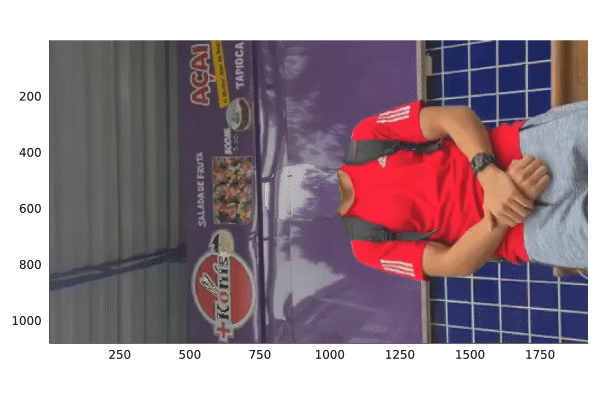

In [19]:
changevideo("C:/Users/aninh/.julia/packages/FileIO/Nl9Lh/paulosemcabeca.avi", "C:/Users/aninh/.julia/packages/FileIO/Nl9Lh/paulofundosemcabeca.jpg")

┌ Info: Saved animation to 
│   fn = C:\Users\aninh\Julia\anim_fps15.gif
└ @ Plots C:\Users\aninh\.julia\packages\Plots\PGQ1Y\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\aninh\\Julia\\anim_fps15.gif")
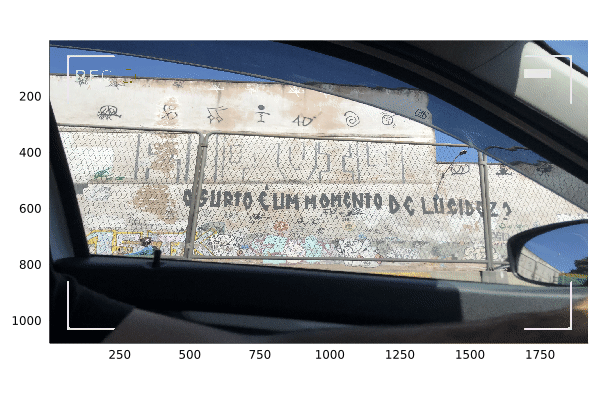

In [21]:
changevideo("C:/Users/aninh/.julia/packages/FileIO/Nl9Lh/pixação.avi", "C:/Users/aninh/.julia/packages/FileIO/Nl9Lh/fundopixação.jpeg")